In [1]:
import numpy as np
import pandas as pd
import polars as pl
import os
import gc
import json
import random
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import zarr

gc.enable()

pd.options.display.max_columns = None
#pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', None)

#pl.Config.set_tbl_rows(-1)
pl.Config.set_tbl_cols(-1)
pl.Config.set_fmt_str_lengths(10000)

polars.config.Config

In [2]:
path = 'I:/Kaggle/czii-cryo-et-object-identification/'

In [3]:
%%time
# Load the first zarr.
test_z_ts_6_4_denoised = zarr.open(path + '/test/static/ExperimentRuns/TS_6_4/VoxelSpacing10.000/denoised.zarr', mode='r')
train_z_ts_6_4_denoised = zarr.open(path + '/train/static/ExperimentRuns/TS_6_4/VoxelSpacing10.000/denoised.zarr', mode='r')
train_z_ts_6_4_iso = zarr.open(path + '/train/static/ExperimentRuns/TS_6_4/VoxelSpacing10.000/isonetcorrected.zarr', mode='r')
train_z_ts_6_4_dcon = zarr.open(path + '/train/static/ExperimentRuns/TS_6_4/VoxelSpacing10.000/ctfdeconvolved.zarr', mode='r')
train_z_ts_6_4_wbp = zarr.open(path + '/train/static/ExperimentRuns/TS_6_4/VoxelSpacing10.000/wbp.zarr', mode='r')

CPU times: total: 15.6 ms
Wall time: 24.9 ms


In [4]:
type(train_z_ts_6_4_denoised)

zarr.core.group.Group

In [5]:
train_z_ts_6_4_denoised

<Group file://I:/Kaggle/czii-cryo-et-object-identification/train/static/ExperimentRuns/TS_6_4/VoxelSpacing10.000/denoised.zarr>

In [6]:
dir(train_z_ts_6_4_denoised)

['__annotations__',
 '__class__',
 '__contains__',
 '__dataclass_fields__',
 '__dataclass_params__',
 '__delattr__',
 '__delitem__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__match_args__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_async_group',
 '_sync',
 '_sync_iter',
 'array',
 'array_keys',
 'array_values',
 'arrays',
 'attrs',
 'basename',
 'create',
 'create_array',
 'create_dataset',
 'create_group',
 'empty',
 'empty_like',
 'from_store',
 'full',
 'full_like',
 'get',
 'group_keys',
 'group_values',
 'groups',
 'info',
 'info_complete',
 'keys',
 'members',
 'metadata',
 'move',
 'name',
 'nmembers',
 'ones',
 'ones_like',
 'open',
 'path',
 'rea

In [7]:
train_z_ts_6_4_denoised.metadata

GroupMetadata(attributes={'multiscales': [{'axes': [{'name': 'z', 'type': 'space', 'unit': 'angstrom'}, {'name': 'y', 'type': 'space', 'unit': 'angstrom'}, {'name': 'x', 'type': 'space', 'unit': 'angstrom'}], 'datasets': [{'coordinateTransformations': [{'scale': [10.012444196428572, 10.012444196428572, 10.012444537618887], 'type': 'scale'}], 'path': '0'}, {'coordinateTransformations': [{'scale': [20.024888392857143, 20.024888392857143, 20.024889075237773], 'type': 'scale'}], 'path': '1'}, {'coordinateTransformations': [{'scale': [40.049776785714286, 40.049776785714286, 40.04977815047555], 'type': 'scale'}], 'path': '2'}], 'metadata': {}, 'name': '/', 'version': '0.4'}]}, zarr_format=2, consolidated_metadata=None, node_type='group')

In [8]:
len(train_z_ts_6_4_denoised)

3

In [9]:
print(list(train_z_ts_6_4_denoised.keys()))

['1', '0', '2']


In [10]:
print(test_z_ts_6_4_denoised)
print(test_z_ts_6_4_denoised['0'].shape)
print(test_z_ts_6_4_denoised['1'].shape)
print(test_z_ts_6_4_denoised['2'].shape)

<Group file://I:/Kaggle/czii-cryo-et-object-identification/test/static/ExperimentRuns/TS_6_4/VoxelSpacing10.000/denoised.zarr>
(184, 630, 630)
(92, 315, 315)
(46, 158, 158)


In [11]:
print(train_z_ts_6_4_denoised)
print(train_z_ts_6_4_denoised['0'].shape)
print(train_z_ts_6_4_denoised['1'].shape)
print(train_z_ts_6_4_denoised['2'].shape)

<Group file://I:/Kaggle/czii-cryo-et-object-identification/train/static/ExperimentRuns/TS_6_4/VoxelSpacing10.000/denoised.zarr>
(184, 630, 630)
(92, 315, 315)
(46, 158, 158)


In [14]:
train_z_ts_6_4_denoised['0'][0].shape

(630, 630)

In [15]:
train_z_ts_6_4_denoised['0'][0][0].shape

(630,)

In [17]:
train_z_ts_6_4_denoised['0'][0][0][0].shape

()

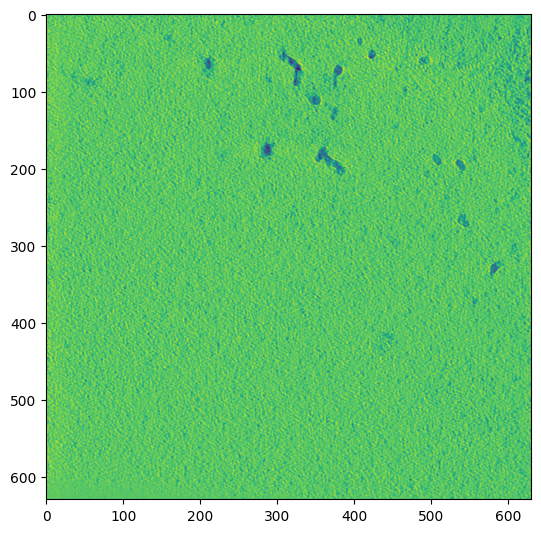

In [20]:
fig = plt.figure(figsize=(6.3,6.3))
_ = plt.imshow(test_z_ts_6_4_denoised['0'][0])

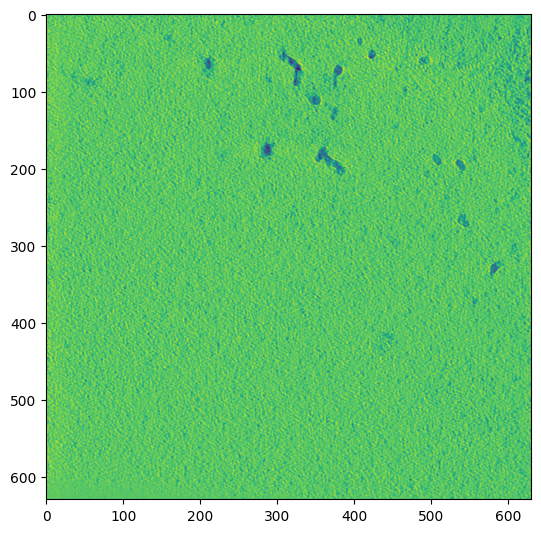

In [21]:
fig = plt.figure(figsize=(6.3,6.3))
_ = plt.imshow(train_z_ts_6_4_denoised['0'][0])

In [25]:
(train_z_ts_6_4_denoised['0'][0] == test_z_ts_6_4_denoised['0'][0]).sum() == 630*630

True

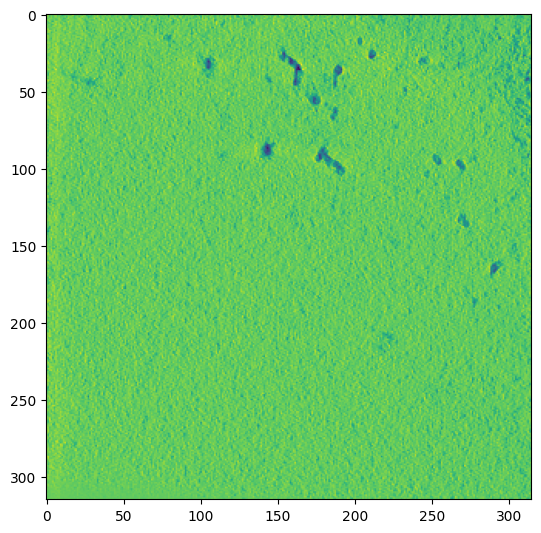

In [22]:
fig = plt.figure(figsize=(6.3,6.3))
_ = plt.imshow(train_z_ts_6_4_denoised['1'][0])

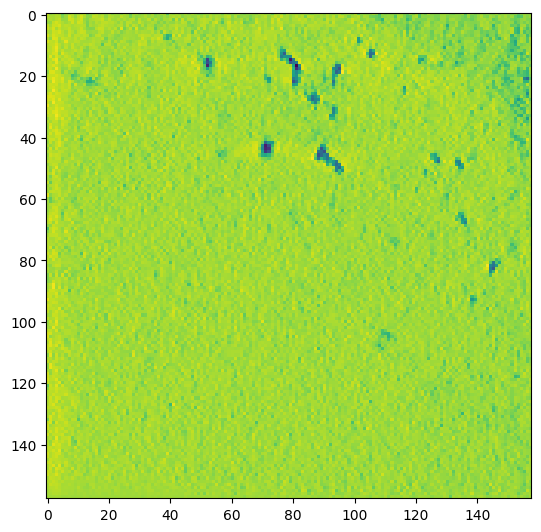

In [26]:
fig = plt.figure(figsize=(6.3,6.3))
_ = plt.imshow(train_z_ts_6_4_denoised['2'][0])

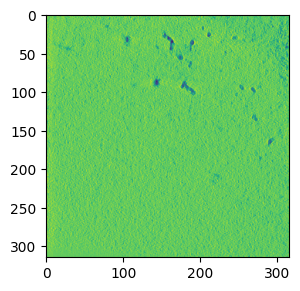

In [27]:
fig = plt.figure(figsize=(3.15,3.15))
_ = plt.imshow(train_z_ts_6_4_denoised['1'][0])

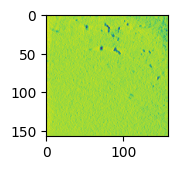

In [28]:
fig = plt.figure(figsize=(1.58,1.58))
_ = plt.imshow(train_z_ts_6_4_denoised['2'][0])

CPU times: total: 2min 19s
Wall time: 21.2 s


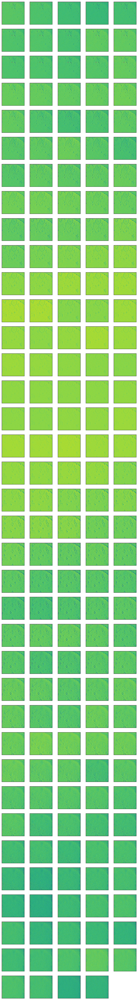

In [29]:
%%time
# Plot the first 25 of...not sure what we're looking at yet.  :)
fig = plt.figure(figsize=(10,74))
for i in range(184):
    ax = plt.subplot(37, 5, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train_z_ts_6_4_denoised['0'][i])

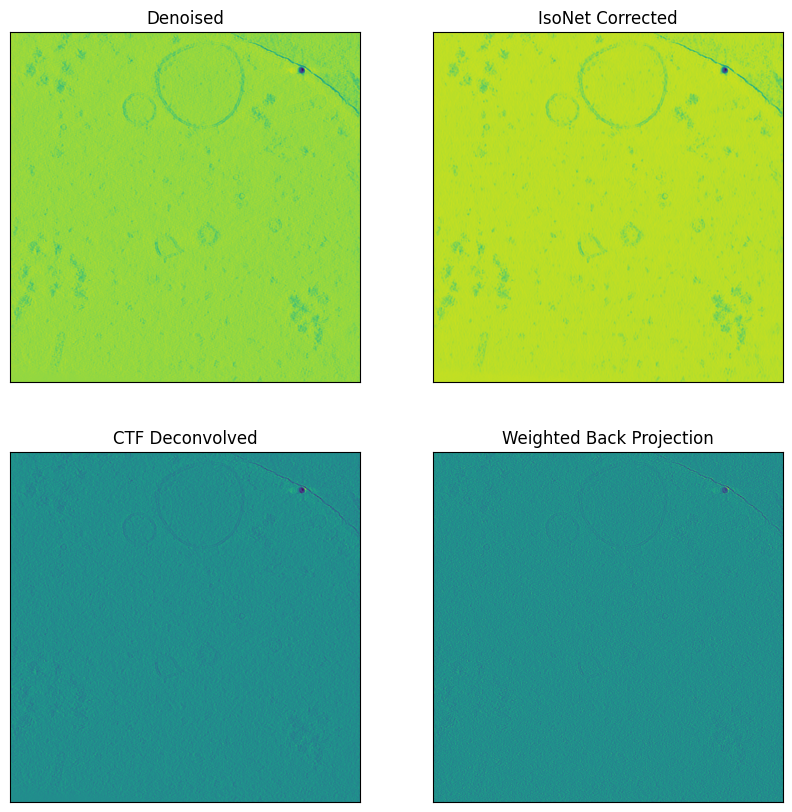

In [30]:
fig = plt.figure(figsize=(10,10))
ax = plt.subplot(2, 2, 1)
plt.xticks([])
plt.yticks([])
plt.title('Denoised')
plt.imshow(train_z_ts_6_4_denoised['0'][62])#, cmap='gray')
ax = plt.subplot(2, 2, 2)
plt.xticks([])
plt.yticks([])
plt.title('IsoNet Corrected')
plt.imshow(train_z_ts_6_4_iso['0'][62])#, cmap='gray')
ax = plt.subplot(2, 2, 3)
plt.xticks([])
plt.yticks([])
plt.title('CTF Deconvolved')
plt.imshow(train_z_ts_6_4_dcon['0'][62])#, cmap='gray')
ax = plt.subplot(2, 2, 4)
plt.xticks([])
plt.yticks([])
plt.title('Weighted Back Projection')
_ = plt.imshow(train_z_ts_6_4_wbp['0'][62])#, cmap='gray')

# References

1. https://www.kaggle.com/code/davidlist/experiment-ts-6-4-visualization
2. https://www.kaggle.com/code/nk35jk/3d-visualization-of-particles